# tests for differentiation and interpolation operators

In [1]:
from pathlib import Path

import xarray as xr

import time

#add location of SimpleFlows
import sys
sys.path.append(str(Path("../").resolve()))

from pint import UnitRegistry
ureg = UnitRegistry() #use to parse resolutions

%load_ext autoreload
%autoreload 2
#dev env

In [2]:
import matplotlib.pyplot as plt

In [3]:
from sgs_tools.plotting.plots import tensor_plot

## Test on grid-aligned Simple shear flow

In [22]:
from sgs_tools.simple_flows.SimpleShear import SimpleShear
from sgs_tools.simple_flows.Geometry import CartesianGrid

### test data

Text(0.5, 0.98, 'v1')

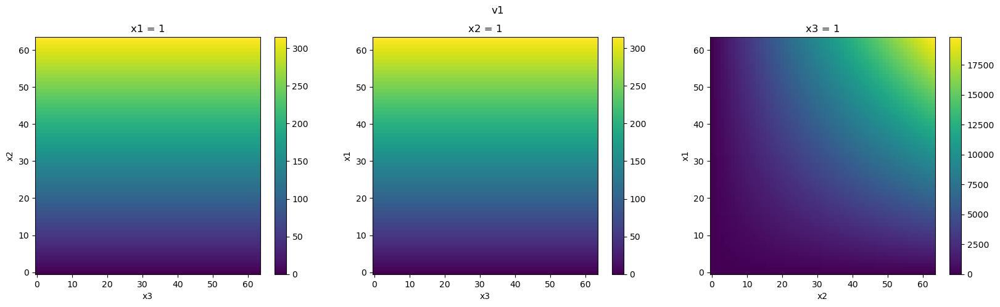

In [23]:
velcomp = 1
direction = [0,1]
grid = CartesianGrid([0,0,0])
shear = SimpleShear(grid = grid, 
                    directions = direction, 
                    velcomp = velcomp, 
                    amplitude = 5)
vel = shear.velocity([64, 64, 64])
# Delta
delta_x = vel.x1[1] - vel.x1[0]

fig, ax = plt.subplots(1, 3, figsize= (20, 5))
vel.sel(c1=velcomp, x1= 1).plot(ax = ax[0])
vel.sel(c1=velcomp, x2= 1).plot(ax = ax[1])
vel.sel(c1=velcomp, x3= 1).plot(ax = ax[2])
plt.suptitle(f'v{velcomp}')

In [7]:
vel_sq = vel**2

Text(0.5, 0.98, 'v1')

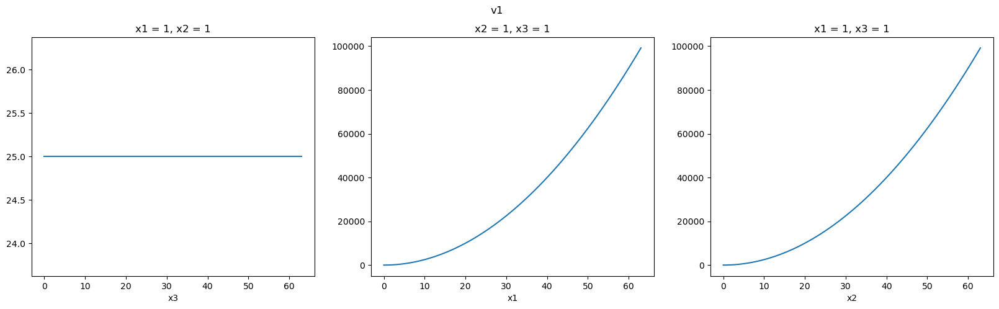

In [9]:
fig, ax = plt.subplots(1, 3, figsize= (20, 5))
vel_sq.sel(c1=velcomp, x1= 1, x2=1).plot(ax = ax[0])
vel_sq.sel(c1=velcomp, x2= 1, x3=1).plot(ax = ax[1])
vel_sq.sel(c1=velcomp, x3= 1, x1=1).plot(ax = ax[2])
plt.suptitle(f'v{velcomp}')

In [10]:
delta_x

<xarray.DataArray 'x1' ()>
array(1)

### Test vector gradient

In [11]:
from sgs_tools.physics.tensor_algebra import grad_vector, grad_vector_lin

In [12]:
gradvel = grad_vector(vel, space_dims = ['x1', 'x2', 'x3'], new_dim_name='dx')    
gradvel_sq = grad_vector(vel_sq, space_dims = ['x1', 'x2', 'x3'], new_dim_name='dx')       

In [13]:
gradvel_lin = grad_vector_lin(vel, space_dims = ['x1', 'x2', 'x3'], new_dim_name='dx')    
gradvel_lin_sq = grad_vector_lin(vel_sq, space_dims = ['x1', 'x2', 'x3'], new_dim_name='dx')       

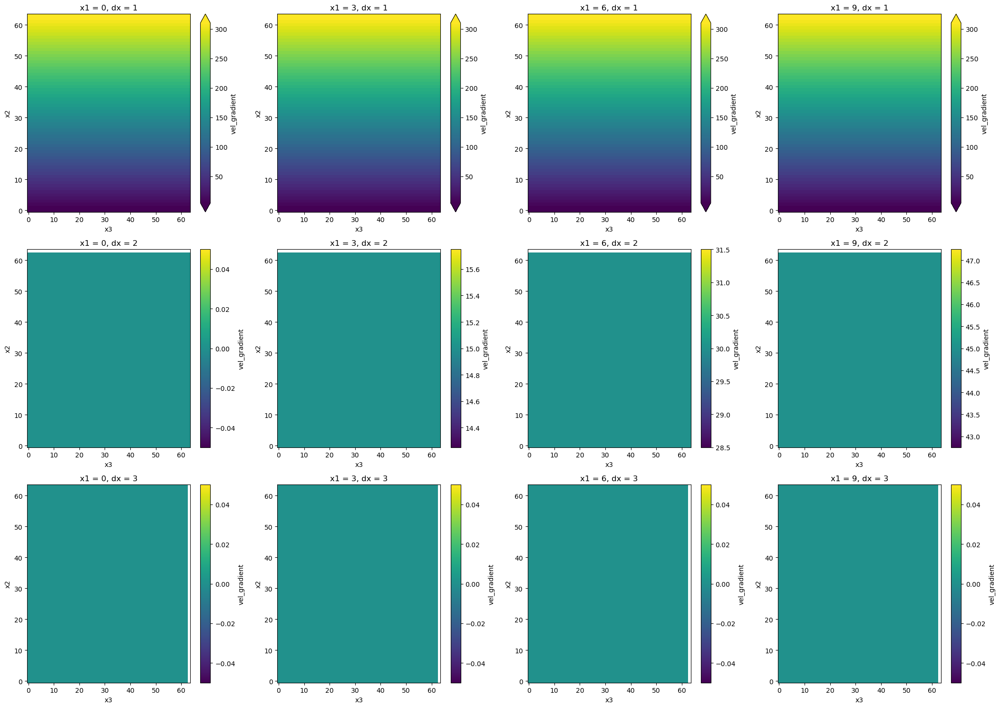

In [14]:
tensor_plot(gradvel_lin.isel(c1=1, x1=slice(0, 10, 3)), grid_dims = ['x1', 'dx']);

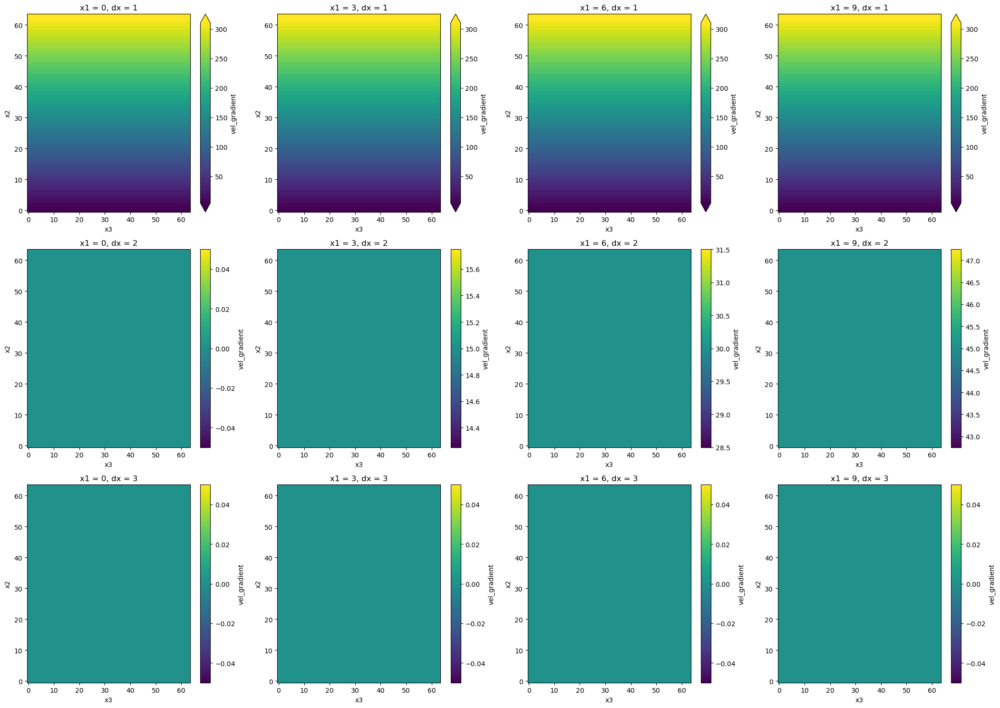

In [15]:
tensor_plot(gradvel.isel(c1=1, x1=slice(0, 10, 3)), grid_dims = ['x1', 'dx']);

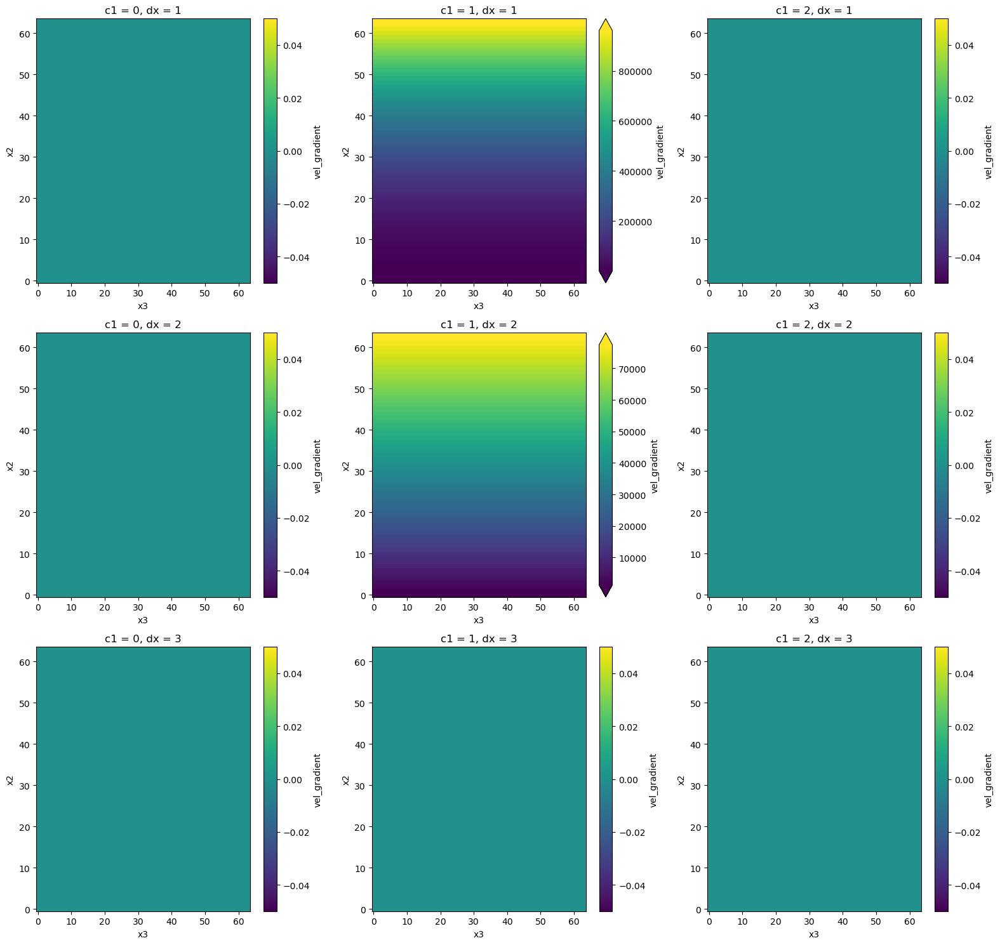

In [16]:
tensor_plot(gradvel_sq.sel(x1=5), grid_dims = ['c1', 'dx']);

## Test on staggered grid

In [4]:
from pathlib import Path
import xarray as xr
import time
from pint import UnitRegistry
ureg = UnitRegistry() #use to parse resolutions

### from simulation

In [5]:
# ext_path = Path('/Volumes/Work/NERC postdoc/')
ext_path = Path('/Users/dv270/NERC postdoc/online_datatest/')
rel_path = 'CBL/cylc-run/DEBUG'

#### Read from Stash files

In [6]:
from sgs_tools.io.um import read_stash_files

#ask for the following fields, if avaialable
required_fields =['u', 'v', 'w', 'theta', 
                  's', 's_1', 's2d', 's4d',
                  'lm', 'qn', 'mm', 'nn',                  
                  'csDelta', 'cs2d', 'cs4d',                
                  'SMAG__VISC_M', 'SMAG__VISC_H',
                  #with dynamic Pr
                  'cs_theta', 'cs_theta_2d', 'cs_theta_4d',
                  'ht', 'tt', 'rf', 'ff',
                  #with Lagrangian averaging
                  'LM', 'MM', 'QN', 'NN',
                  'Tdecorr_momentum',
                  # and dynamic Pr
                  'HT','TT','RF','FF',
                  'Tdecorr_heat',
                  # custom diagnostics -- carefull as these are unlabeled and hence volatile
                  'diag11', 'diag22', 'diag33',
                  'diag23', 'diag13', 'diag12',                 
                  ]

In [237]:
rose = 'de464'
resolution = '200m'
file_codes = ['r', 'b']

#read UM stasth files: data
simulation = read_stash_files(ext_path / rel_path,
                              rose_suite=rose, resolution=resolution, file_codes=file_codes)

Reading /Users/dv270/NERC postdoc/online_datatest/CBL/cylc-run/DEBUG/de464_200ma_pr000.nc
Reading /Users/dv270/NERC postdoc/online_datatest/CBL/cylc-run/DEBUG/de464_200ma_pb000.nc


#### Preprocess simulation (rename and put on a single grid)

In [175]:
from sgs_tools.io.um import (rename_variables,
                             restrict_ds,
                             unify_coords)
from sgs_tools.physics.staggered_grid import (interpolate_to_grid, 
                                              get_grid_spacing_coord)

In [238]:
%%time
#parse UM stash codes into variable names
simulation = rename_variables(simulation)

#restrict to interesting fields and rename to simple names
simulation = restrict_ds(simulation, fields = required_fields)

# #unify coordinates
simulation = unify_coords(simulation , res= ureg(resolution).to('m').magnitude)

CPU times: user 18.8 ms, sys: 1.65 ms, total: 20.4 ms
Wall time: 20.2 ms


In [239]:
simulation = simulation.rename({'diag11': 's_11', 'diag22' : 's_22', 'diag33' : 's_33',
                                'diag23': 's_23', 'diag13' : 's_13', 'diag12' : 's_12'})

In [240]:
simulation_0 = simulation.sel(t=30, t_0 = 30).rename({'z_theta' : 'z_centre', 'z_rho': 'z_face'}).drop(['min15T0_0', 't_0', 'min15T0', 't'])

In [203]:
# cutoff the last point to make all fields have the same number of points
# simulation_0 = simulation_0.isel(z_centre = slice(None, -1))

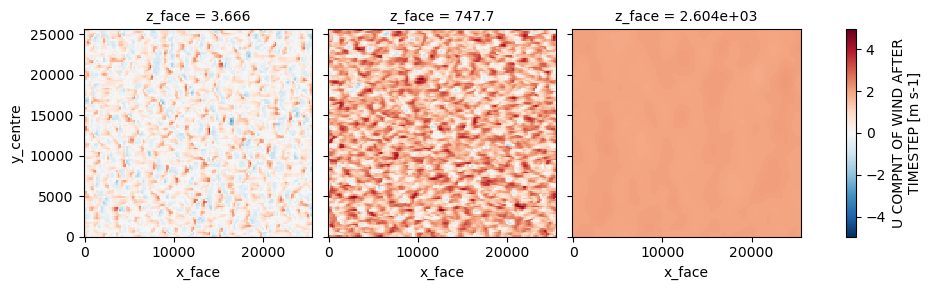

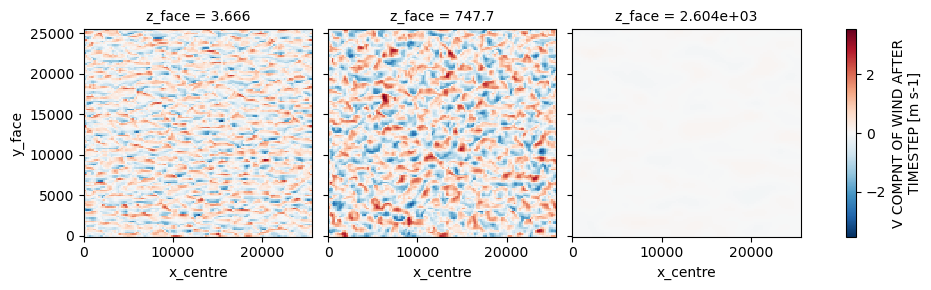

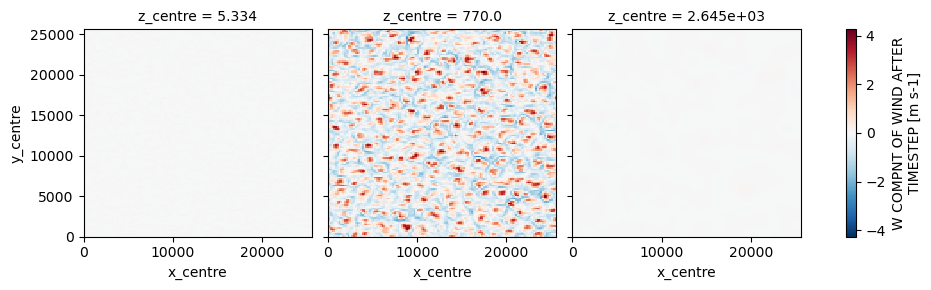

In [241]:
simulation_0['u'].isel(z_face = [0, 31, 60]).plot(col='z_face')
plt.show()
simulation_0['v'].isel(z_face = [0, 31, 60]).plot(col='z_face')
plt.show()
simulation_0['w'].isel(z_centre = [0, 31, 60]).plot(col='z_centre')
plt.show()

#### test simulaton

In [242]:
from sgs_tools.physics.staggered_grid import interpolate_to_grid, \
                                             diff_lin_on_grid, \
                                             grad_on_cart_grid, \
                                             grad_vec_on_grid

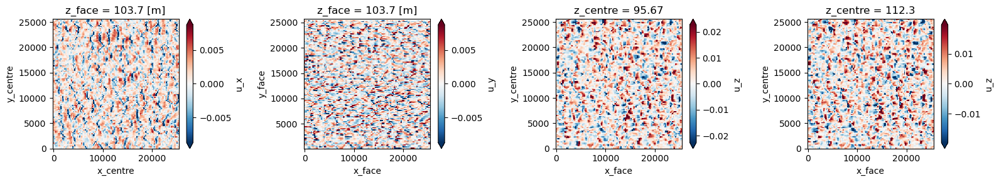

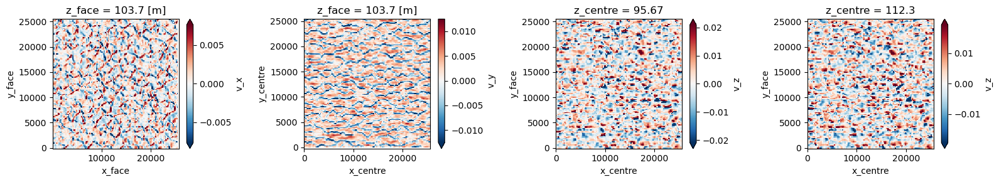

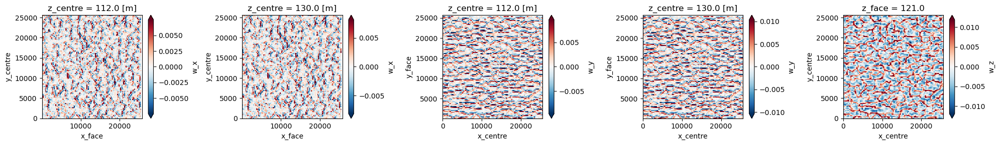

In [268]:
grad_u = grad_on_cart_grid(simulation_0['u'], simulation_0['u'].dims)
grad_v = grad_on_cart_grid(simulation_0['v'], simulation_0['v'].dims)
grad_w = grad_on_cart_grid(simulation_0['w'], simulation_0['w'].dims)

fig, axes = plt.subplots(1, 4, figsize = (16, 3))
grad_u['u_x'].isel(z_face =10).plot(ax = axes[0], robust=True)
grad_u['u_y'].isel(z_face =10).plot(ax = axes[1], robust=True)
grad_u['u_z'].isel(z_centre   =10).plot(ax = axes[2], robust=True)
grad_u['u_z'].isel(z_centre   =11).plot(ax = axes[3], robust=True)
plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 4, figsize = (16, 3))
grad_v['v_x'].isel(z_face =10).plot(ax = axes[0], robust=True)
grad_v['v_y'].isel(z_face =10).plot(ax = axes[1], robust=True)
grad_v['v_z'].isel(z_centre   =10).plot(ax = axes[2], robust=True)
grad_v['v_z'].isel(z_centre   =11).plot(ax = axes[3], robust=True)
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 5, figsize = (20, 3))
grad_w['w_x'].isel(z_centre   =10).plot(ax = axes[0], robust=True)
grad_w['w_x'].isel(z_centre   =11).plot(ax = axes[1], robust=True)

grad_w['w_y'].isel(z_centre   =10).plot(ax = axes[2], robust=True)
grad_w['w_y'].isel(z_centre   =11).plot(ax = axes[3], robust=True)

grad_w['w_z'].isel(z_face =10).plot(ax = axes[4], robust=True)
plt.tight_layout()
plt.show()

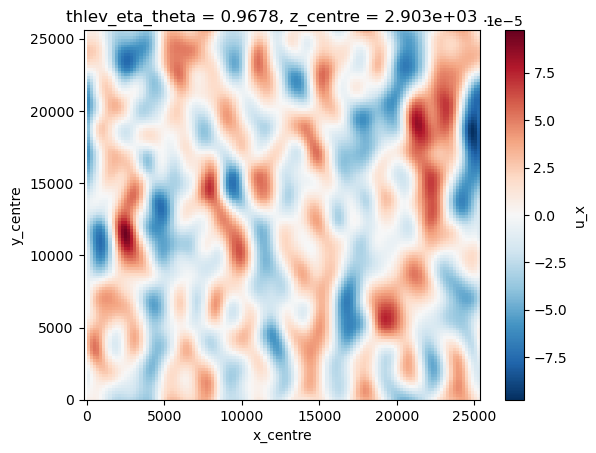

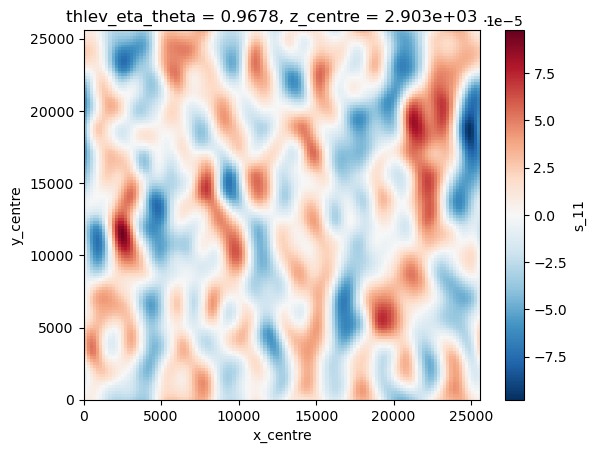

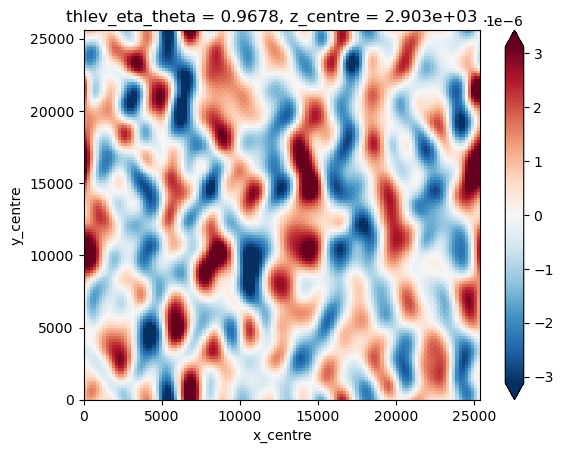

In [278]:
coord_map = {'z_face':  simulation_0['z_centre']}
ux_on_cent = interpolate_to_grid(grad_u['u_x'], coord_map = coord_map)

ux_on_cent.isel(z_centre = -1).plot()
# plt.xlim(400, 1000)
# plt.ylim(400, 1000)
plt.show()
(simulation_0['s_11'].isel(z_centre = -1)/2).plot()
# plt.xlim(400, 1000)
# plt.ylim(400, 1000)
plt.show()
(simulation_0['s_11'].isel(z_centre = -1)/2 - ux_on_cent.isel(z_centre = -1) ).plot(robust = True)
# plt.xlim(400, 1000)
# plt.ylim(400, 1000)

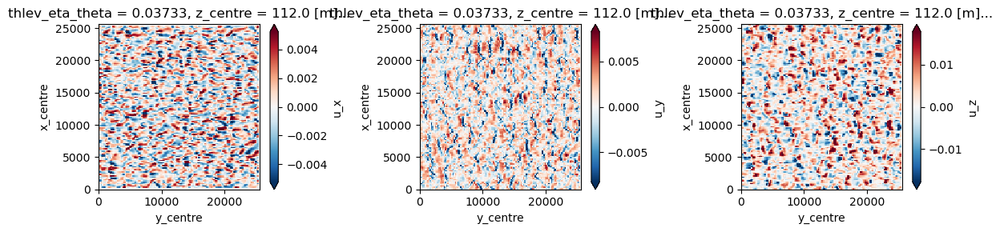

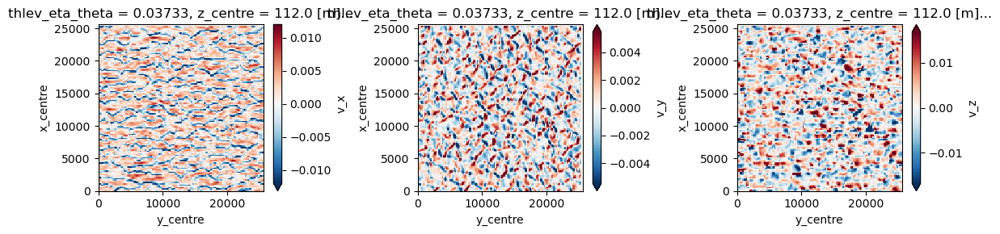

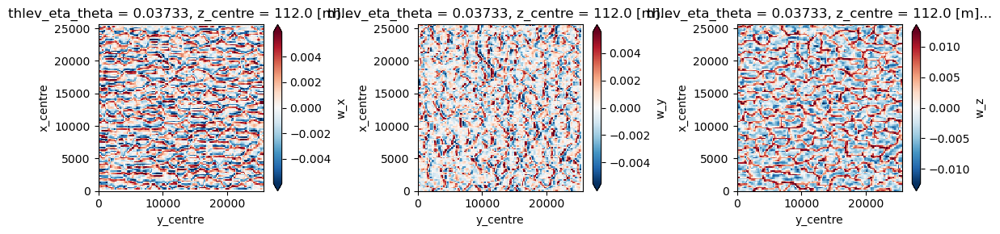

In [56]:
coord_map = {'z_face': ds['z_centre'],
 'y_face': ds['y_centre'],
 'x_face': ds['x_centre'],
 'x_centre': ds['x_centre'],
 'y_centre': ds['y_centre'],
 'z_centre': ds['z_centre']}
grad_u_on_cent = interpolate_to_grid(grad_u, coord_map = coord_map)
grad_v_on_cent = interpolate_to_grid(grad_v, coord_map = coord_map)
grad_w_on_cent = interpolate_to_grid(grad_w, coord_map = coord_map)

fig, axes = plt.subplots(1, 3, figsize = (12, 3))
grad_u_on_cent['u_x'].isel(z_centre =10).plot(ax = axes[0], robust=True)
grad_u_on_cent['u_y'].isel(z_centre =10).plot(ax = axes[1], robust=True)
grad_u_on_cent['u_z'].isel(z_centre =10).plot(ax = axes[2], robust=True)
plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 3, figsize = (12, 3))
grad_v_on_cent['v_x'].isel(z_centre =10).plot(ax = axes[0], robust=True)
grad_v_on_cent['v_y'].isel(z_centre =10).plot(ax = axes[1], robust=True)
grad_v_on_cent['v_z'].isel(z_centre =10).plot(ax = axes[2], robust=True)
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 3, figsize = (12, 3))
grad_w_on_cent['w_x'].isel(z_centre =10).plot(ax = axes[0], robust=True)
grad_w_on_cent['w_y'].isel(z_centre =10).plot(ax = axes[1], robust=True)
grad_w_on_cent['w_z'].isel(z_centre =10).plot(ax = axes[2], robust=True)
plt.tight_layout()
plt.show()

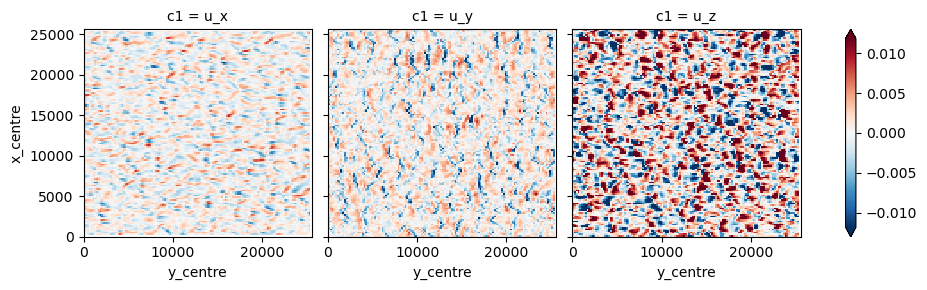

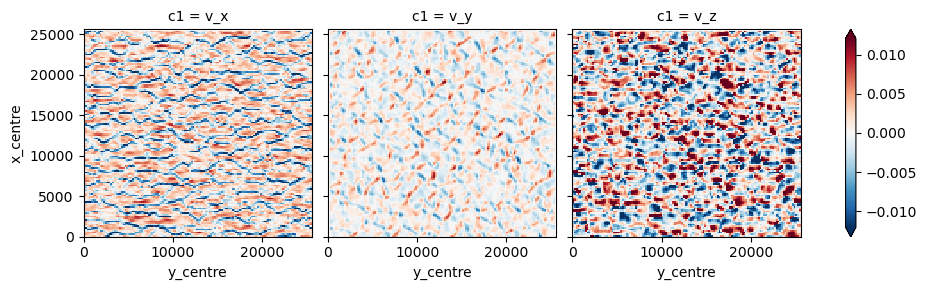

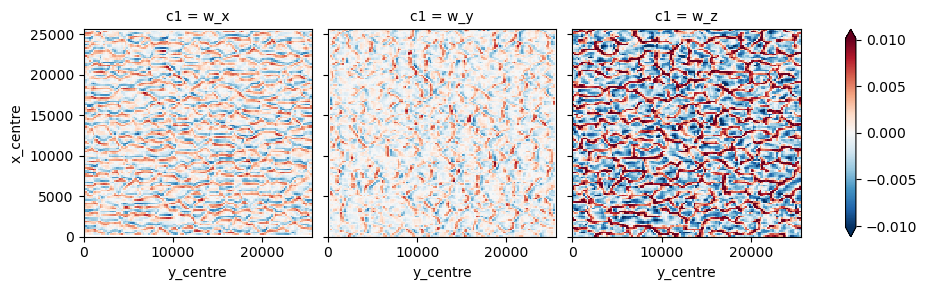

In [57]:
grad_u_on_cent = grad_u_on_cent.to_dataarray('c1').sortby('c1')
grad_v_on_cent = grad_v_on_cent.to_dataarray('c1').sortby('c1')
grad_w_on_cent = grad_w_on_cent.to_dataarray('c1').sortby('c1')

grad_u_on_cent['c1'] = ['dx', 'dy', 'dz']
grad_v_on_cent['c1'] = ['dx', 'dy', 'dz']
grad_w_on_cent['c1'] = ['dx', 'dy', 'dz']

grad_u_on_cent.isel(z_centre =10).plot(col='c1', robust=True);
plt.show()
grad_v_on_cent.isel(z_centre =10).plot(col='c1', robust=True);
plt.show()
grad_w_on_cent.isel(z_centre =10).plot(col='c1', robust=True);
plt.show()

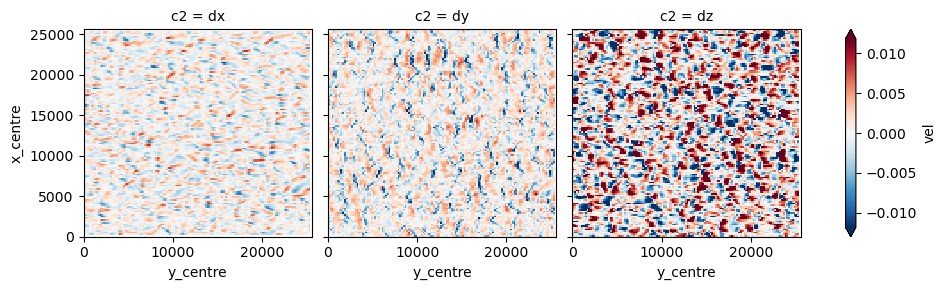

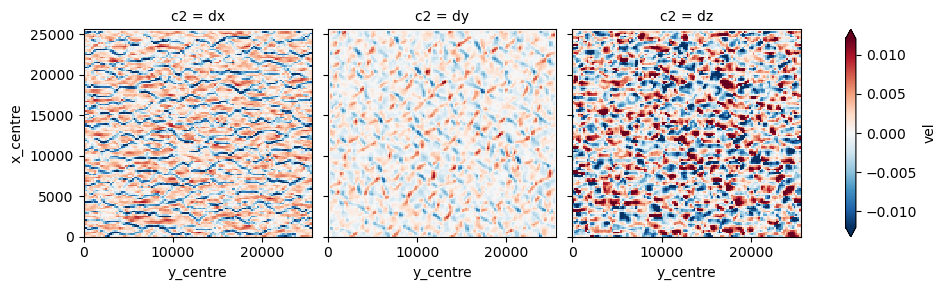

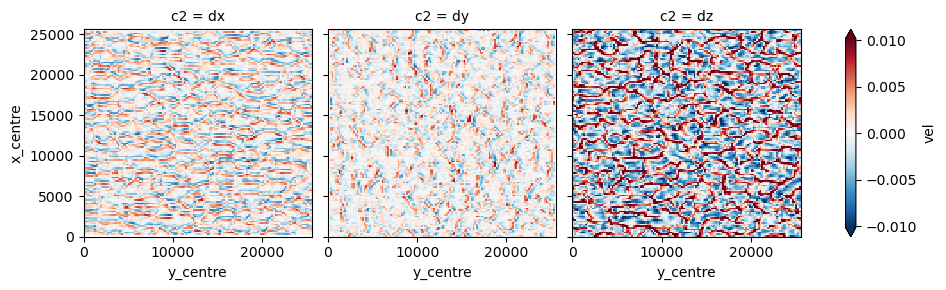

In [70]:
gradvel_da.sel(c1 = 'v1').isel(z_centre =10).plot(col='c2', robust=True);
plt.show()
gradvel_da.sel(c1 = 'v2').isel(z_centre =10).plot(col='c2', robust=True);
plt.show()
gradvel_da.sel(c1 = 'v3').isel(z_centre =10).plot(col='c2', robust=True);
plt.show()

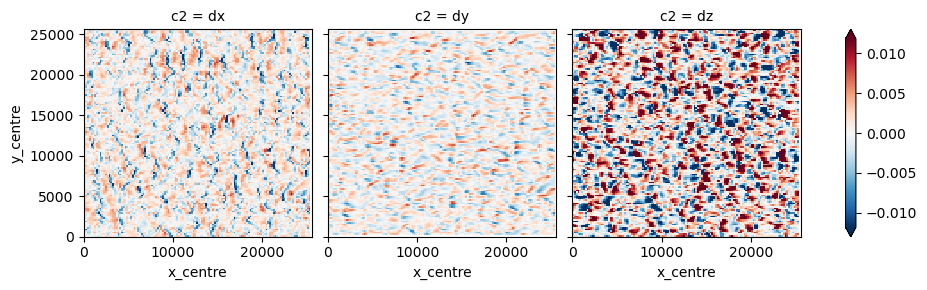

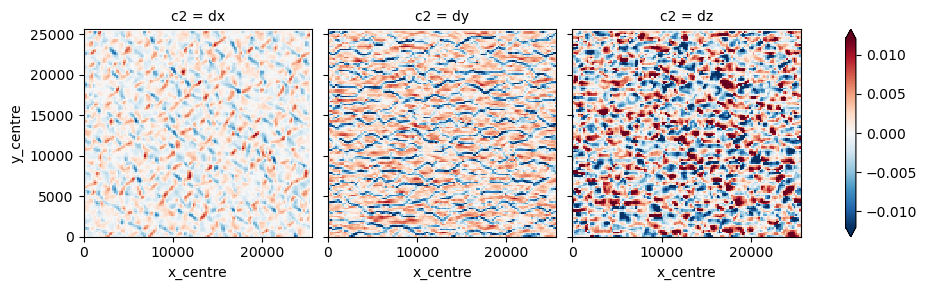

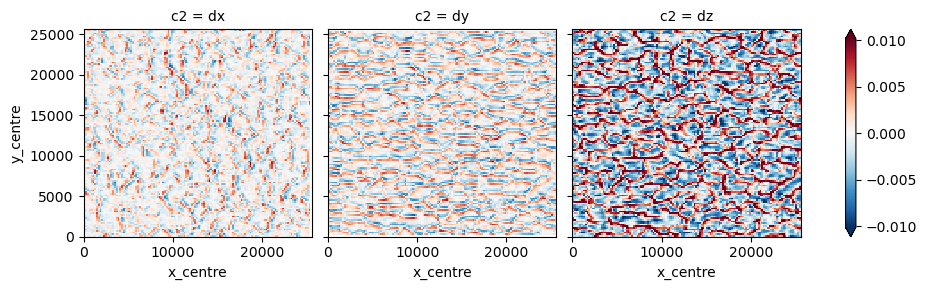

In [249]:
Aij = grad_vec_on_grid(simulation_0[['u','v','w']], ['x_centre', 'y_centre', 'z_centre'], new_dim_name = ['c1', 'c2']).sortby(['c1', 'c2'])

Aij.sel(c1 = 'v1').isel(z_centre =10).plot(col='c2', robust=True);
plt.show()
Aij.sel(c1 = 'v2').isel(z_centre =10).plot(col='c2', robust=True);
plt.show()
Aij.sel(c1 = 'v3').isel(z_centre =10).plot(col='c2', robust=True);
plt.show()

#### look at strain

##### staggered computation

In [287]:
from sgs_tools.physics.tensor_algebra import symmetrise, traceless, trace

In [310]:
Aij = grad_vec_on_grid(simulation_0[['u','v','w']], ['x_centre', 'y_centre', 'z_centre'], new_dim_name = ['c1', 'c2']).sortby(['c1', 'c2'])
aij = Aij.sortby(['c1', 'c2'])
aij['c1'] = [1,2,3]
aij['c2'] = [1,2,3]
sij_staggered = 2*traceless(symmetrise(aij, ['c1', 'c2']), ['c1', 'c2'])

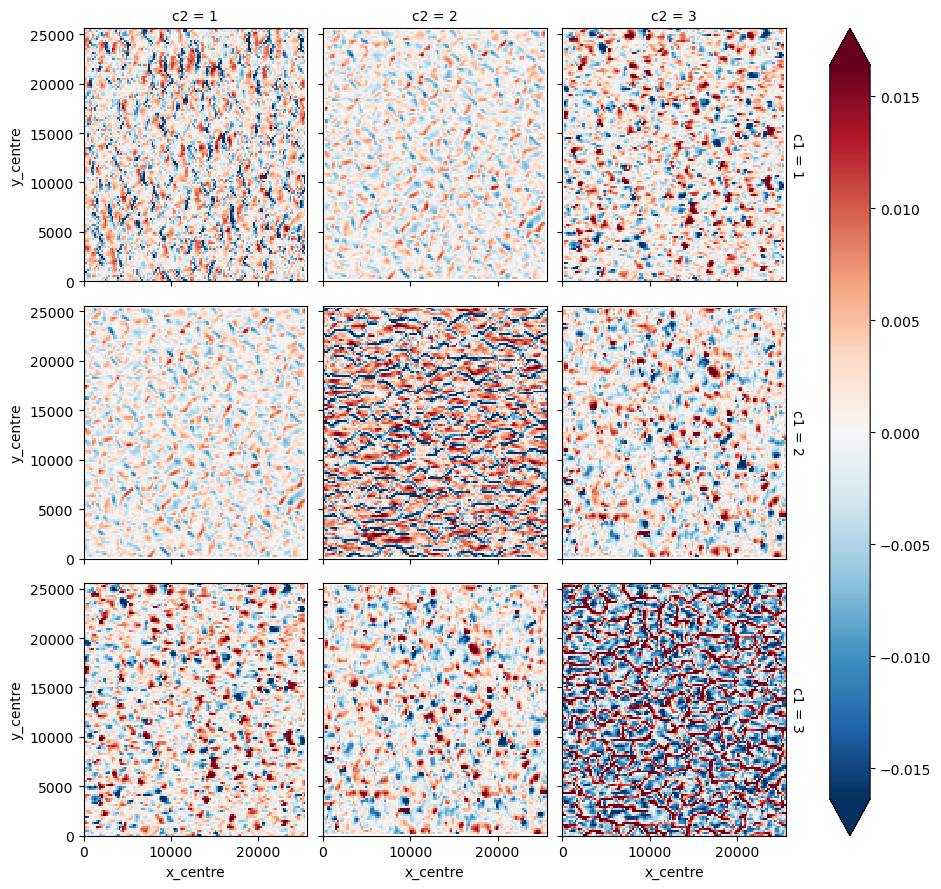

In [311]:
sij_staggered.isel(z_centre =10).plot(col='c2', row='c1', robust=True);

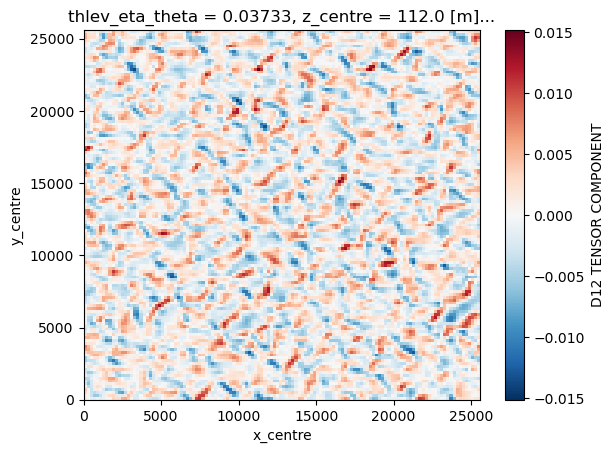

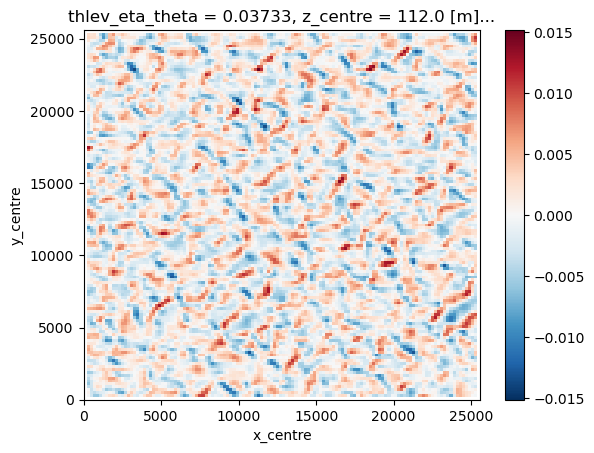

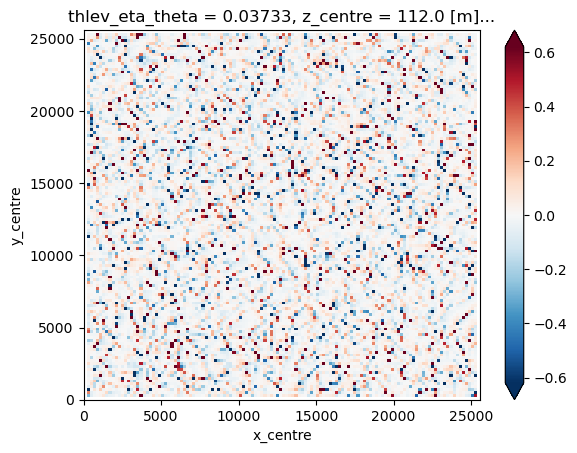

In [312]:
simulation_0['s_12'].isel(z_centre =10).plot()#robust=True)
plt.show()
sij_staggered.sel(c1 = 1, c2 = 2).isel(z_centre =10).plot()#robust=True)
plt.show()
(sij_staggered.sel(c1 = 1, c2 = 2).isel(z_centre =10) / simulation_0['s_12'].isel(z_centre =10) - 1).plot(robust=True)

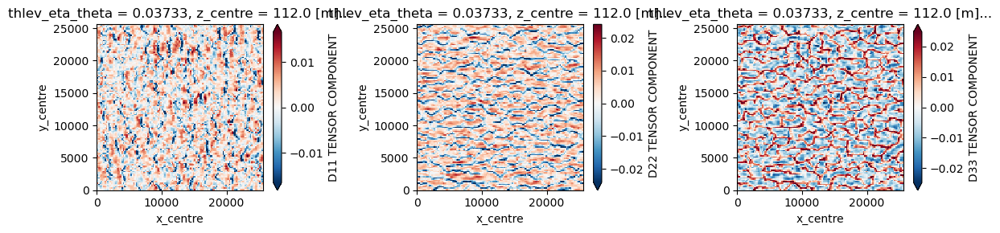

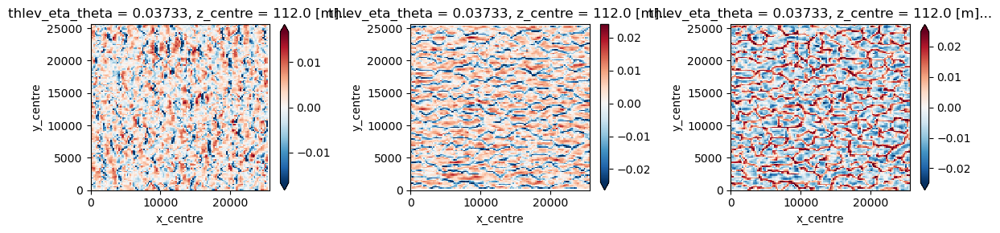

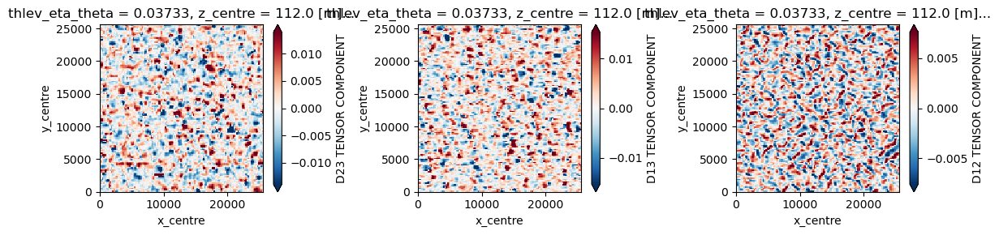

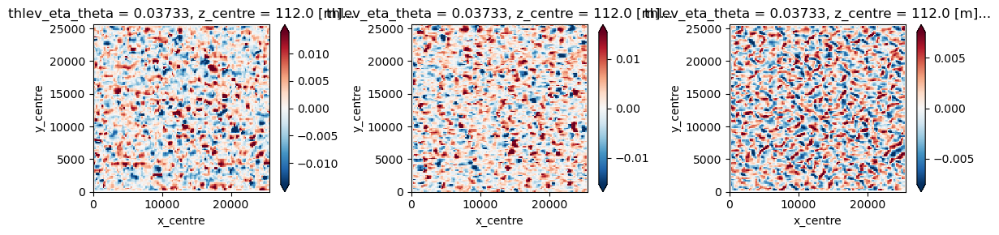

In [313]:
#Compare diagonal terms
fig, axes = plt.subplots(1, 3, figsize = (12, 3))
simulation_0['s_11'].isel(z_centre =10).plot(ax = axes[0], robust=True)
simulation_0['s_22'].isel(z_centre =10).plot(ax = axes[1], robust=True)
simulation_0['s_33'].isel(z_centre =10).plot(ax = axes[2], robust=True)
plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 3, figsize = (12, 3))
sij_staggered.sel(c1 = 1, c2 = 1).isel(z_centre =10).plot(ax = axes[0], robust=True)
sij_staggered.sel(c1 = 2, c2 = 2).isel(z_centre =10).plot(ax = axes[1], robust=True)
sij_staggered.sel(c1 = 3, c2 = 3).isel(z_centre =10).plot(ax = axes[2], robust=True)
plt.tight_layout()
plt.show()


#Compare off-diagonal terms
fig, axes = plt.subplots(1, 3, figsize = (12, 3))
simulation_0['s_23'].isel(z_centre =10).plot(ax = axes[0], robust=True)
simulation_0['s_13'].isel(z_centre =10).plot(ax = axes[1], robust=True)
simulation_0['s_12'].isel(z_centre =10).plot(ax = axes[2], robust=True)
plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 3, figsize = (12, 3))
sij_staggered.sel(c1 = 2, c2 = 3).isel(z_centre =10).plot(ax = axes[0], robust=True)
sij_staggered.sel(c1 = 1, c2 = 3).isel(z_centre =10).plot(ax = axes[1], robust=True)
sij_staggered.sel(c1 = 1, c2 = 2).isel(z_centre =10).plot(ax = axes[2], robust=True)
plt.tight_layout()
plt.show()



##### Pre-interpolated computation

In [330]:
from sgs_tools.physics.staggered_grid import interpolate_to_grid
from sgs_tools.physics.staggered_grid import compose_vector_components_on_grid
from sgs_tools.physics.fields import strain_from_vel

In [343]:
%%time 
#interpolate all vars to a cell-centred grid
centre_dims =['x_centre', 'y_centre', 'z_centre']
simulation0_interp = interpolate_to_grid(simulation_0[['u', 'v', 'w']], centre_dims, drop_coords=True)

vel = compose_vector_components_on_grid([simulation0_interp['u'], simulation0_interp['v'], simulation0_interp['w']],
                                        centre_dims, name = 'vel',
                                        vector_dim = 'c1')

sij = 2*strain_from_vel(vel, space_dims= centre_dims,
                      vec_dim = 'c1', new_dim = 'c2', incompressible =True,
                      )

CPU times: user 79.6 ms, sys: 84.2 ms, total: 164 ms
Wall time: 184 ms


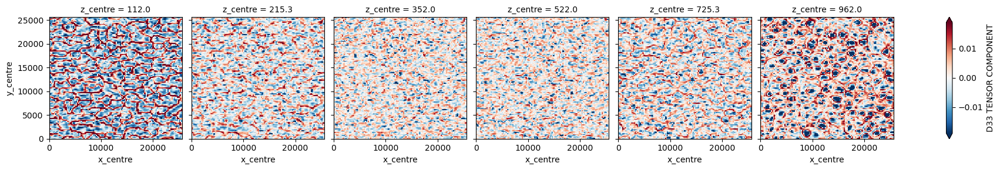

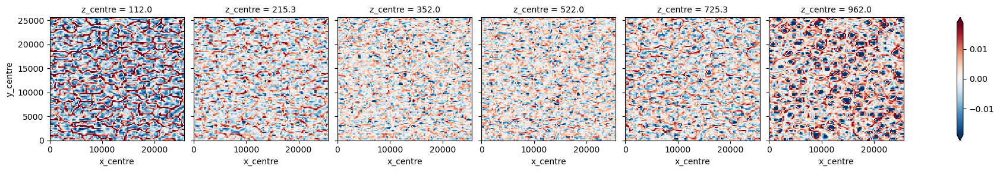

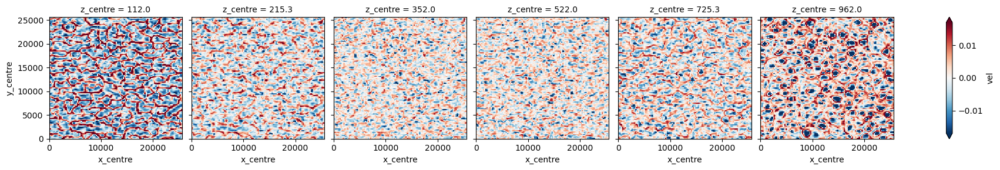

In [344]:
simulation_0['s_33'].isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
sij_staggered.isel(c1= 2, c2=2).isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
sij.isel(c1= 2, c2=2).isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)

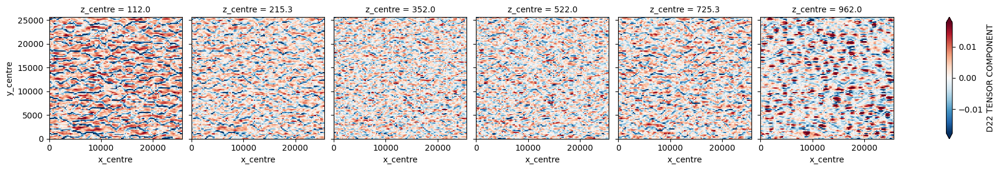

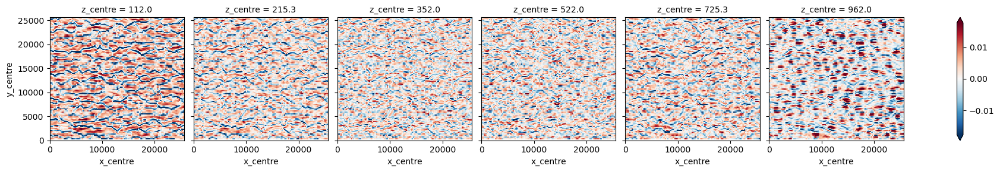

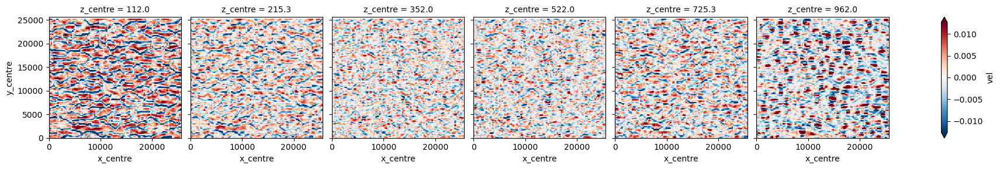

In [345]:
simulation_0['s_22'].isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
sij_staggered.isel(c1= 1, c2=1).isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
sij.isel(c1= 1, c2=1).isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
# (sij_lin.isel(c1=1, c2=1)*2).isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)

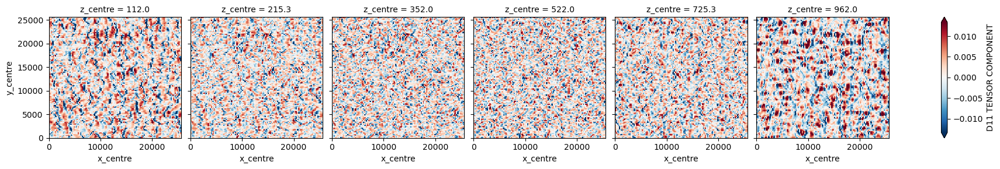

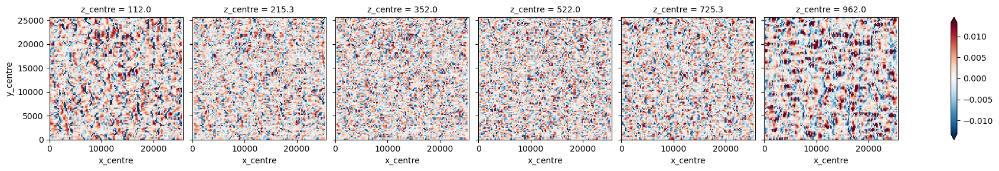

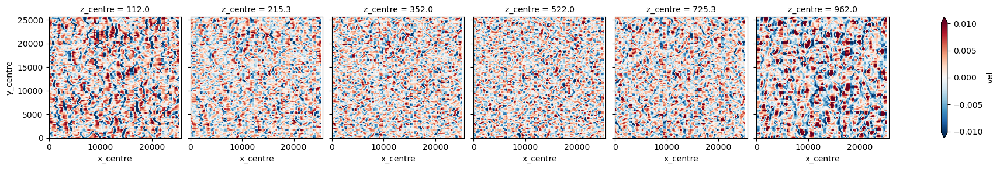

In [346]:
simulation_0['s_11'].isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
sij_staggered.isel(c1= 0, c2=0).isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
sij.isel(c1= 0, c2=0).isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
# (sij_lin.isel(c1= 0, c2=0)*2).isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)

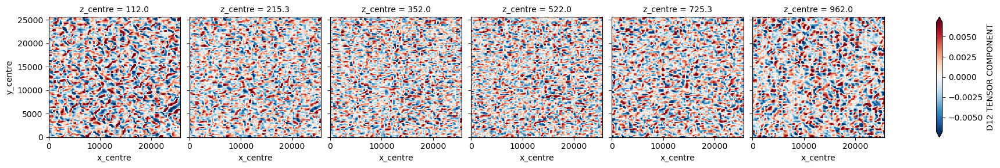

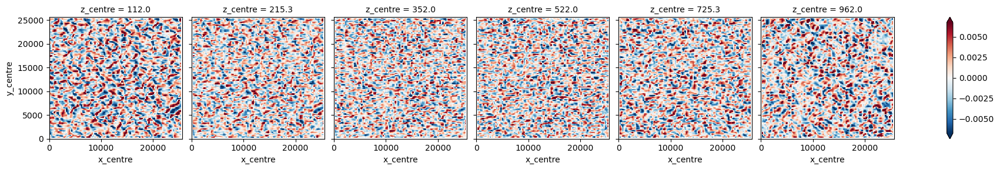

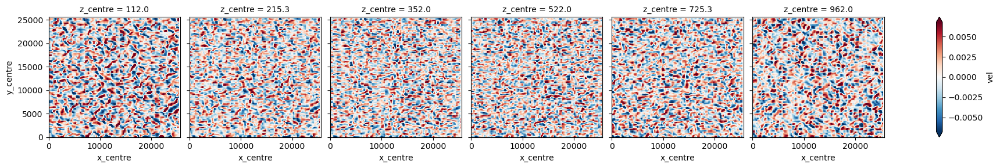

In [347]:
simulation_0['s_12'].isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
sij_staggered.isel(c1= 0, c2=1).isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
sij.isel(c1= 0, c2=1).isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
# (sij_lin.isel(c1= 0, c2=1)*2).isel(z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)


In [72]:
import numpy as np

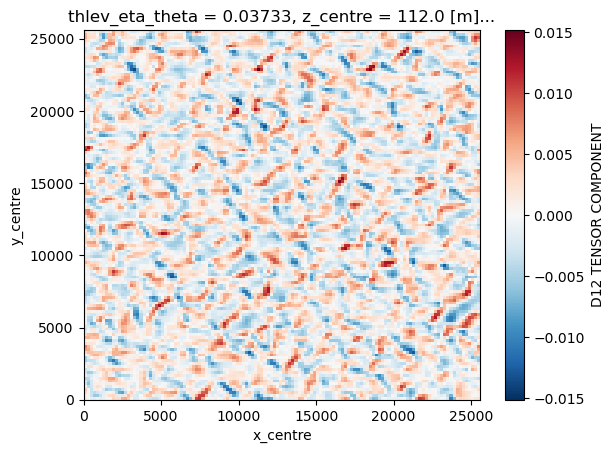

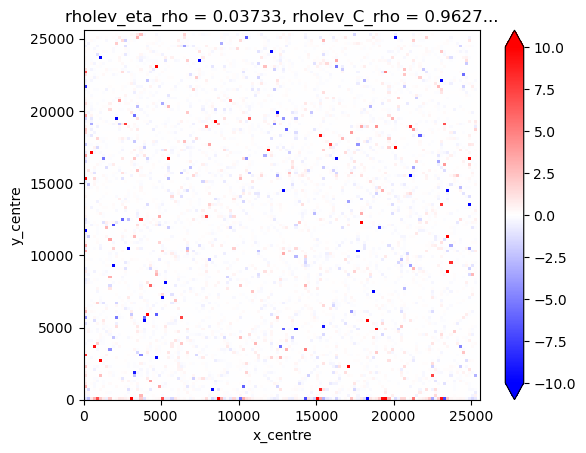

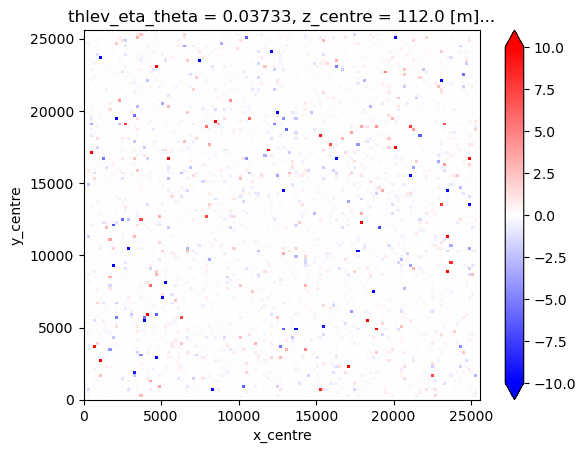

In [352]:
ref = simulation_0['s_12'].isel(z_centre = 10)
ref.plot()
plt.show()
for s in sij, sij_staggered:
    mod = s.isel(c1= 0, c2=1).isel(z_centre = 10)
    (mod.where(np.abs(ref)>1e-6) / ref.where(np.abs(ref)>1e-6) - 1).plot(vmax=10, vmin = -10, cmap = 'bwr')
    plt.show()

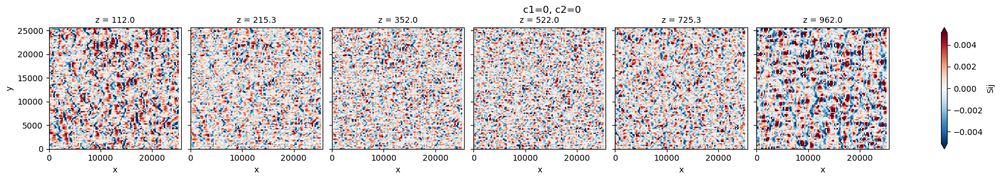

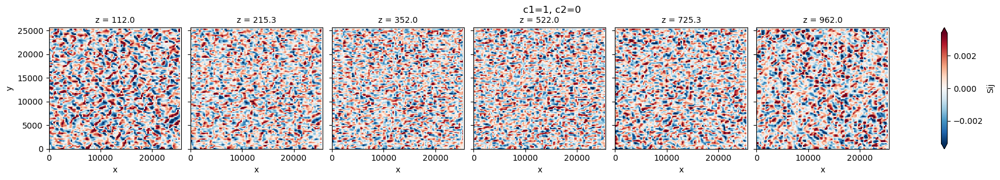

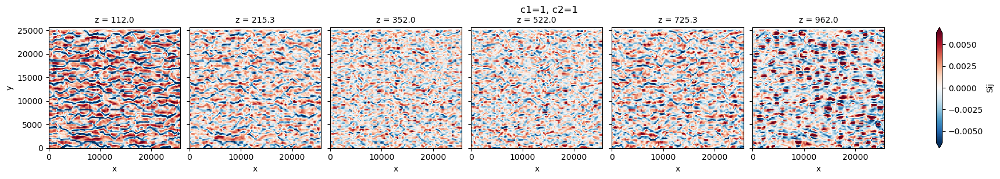

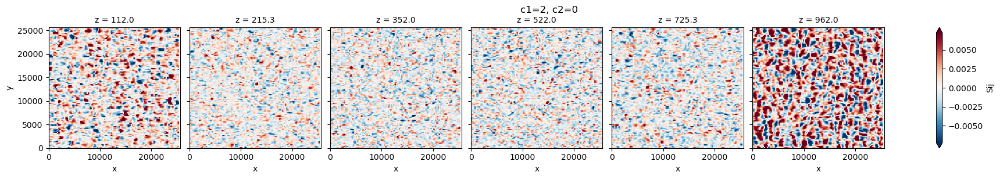

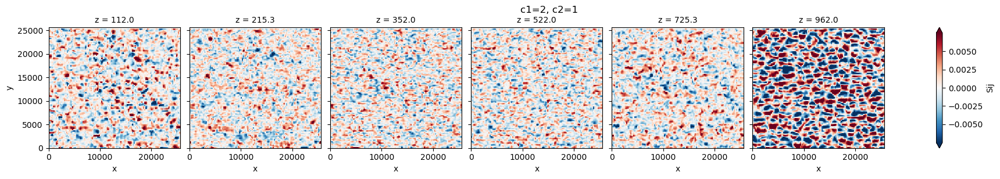

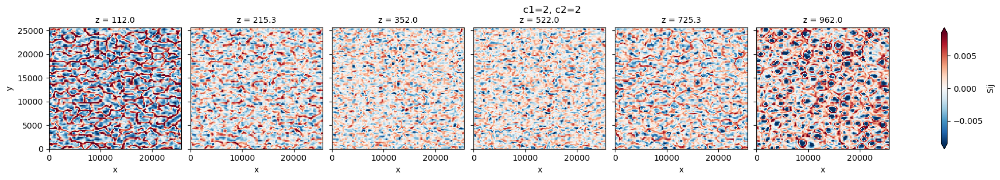

In [22]:
for c1 in range(3):
    for c2 in range(c1+1):
        sij.isel(c1= c1, c2=c2).isel(t_0 = 2, z_centre = slice(10,40, 5)).plot(col='z_centre',robust=True)
        plt.suptitle(f'c1={c1}, c2={c2}', y = 1.01)
        plt.show()

### Simple shear flow

In [ ]:
sys.path.append(str(Path("../").resolve()))


In [8]:
sys.path

['/Users/dv270/NERC_postdoc/Notebooks/SGS_tools/examples',
 '/Users/dv270/prog/miniconda3/envs/py311_update/lib/python311.zip',
 '/Users/dv270/prog/miniconda3/envs/py311_update/lib/python3.11',
 '/Users/dv270/prog/miniconda3/envs/py311_update/lib/python3.11/lib-dynload',
 '',
 '/Users/dv270/prog/miniconda3/envs/py311_update/lib/python3.11/site-packages',
 '/Users/dv270/NERC_postdoc/Notebooks/SGS_tools/src',
 '/Users/dv270/NERC_postdoc/Notebooks/SGS_tools']

In [54]:
from sgs_tools.simple_flows.Geometry import CartesianGrid, CoordScalar
from sgs_tools.geometry.staggered_grid import diff_lin_on_grid, grad_on_cart_grid, interpolate_to_grid, grad_vec_on_grid
import numpy as np

In [50]:
from sgs_tools.simple_flows.SimpleShear import ScalarGradient

In [58]:
from sgs_tools.geometry.grid import UniformCartesianGrid

In [32]:
from dataclasses import dataclass

In [59]:
u_grid = UniformCartesianGrid([0.5, 0, 0.5], [1,1,1])

In [60]:
sc = ScalarGradient(u_grid, 'x1',1.0, 0.0)

In [68]:
sc.field([3,4,5])[1]

<xarray.DataArray (x2: 4, x3: 5)>
array([[1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.]])
Coordinates:
    x1       float64 1.5
  * x2       (x2) float64 0.0 1.0 2.0 3.0
  * x3       (x3) float64 0.5 1.5 2.5 3.5 4.5

In [85]:
assert (sc.field([3,4,5])[1] == 1).all()

In [65]:
(sc.field([3,4,5])* xr.DataArray(2))#[1]

<xarray.DataArray (x1: 3, x2: 4, x3: 5)>
array([[[0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.]],

       [[2., 2., 2., 2., 2.],
        [2., 2., 2., 2., 2.],
        [2., 2., 2., 2., 2.],
        [2., 2., 2., 2., 2.]],

       [[4., 4., 4., 4., 4.],
        [4., 4., 4., 4., 4.],
        [4., 4., 4., 4., 4.],
        [4., 4., 4., 4., 4.]]])
Coordinates:
  * x1       (x1) float64 0.5 1.5 2.5
  * x2       (x2) float64 0.0 1.0 2.0 3.0
  * x3       (x3) float64 0.5 1.5 2.5 3.5 4.5

In [47]:
xr.DataArray(1)

<xarray.DataArray ()>
array(1)

In [11]:
velcomp = 1
direction = [0,1]
u_grid = CartesianGrid([0.5, 0, 0.5])
v_grid = CartesianGrid([0, 0.5, 0.5])
w_grid = CartesianGrid([0.5, 0.5, 0])
u = CoordScalar(grid = u_grid, 
                direction = 0, 
                amplitude = 1).scalar([64, 64, 64]).rename({'x1':'x_centre', 'x2':'y_face', 'x3':'z_centre'})
v = CoordScalar(grid = v_grid, 
                direction = 1, 
                amplitude = 2).scalar([64, 64, 64]).rename({'x1':'x_face', 'x2':'y_centre', 'x3':'z_centre'})

w = CoordScalar(grid = w_grid, 
                direction = 2, 
                amplitude = 3).scalar([64, 64, 64]).rename({'x1':'x_centre', 'x2':'y_centre', 'x3':'z_face'})
simulation = xr.Dataset({'u':u,'v':v,'w':w})

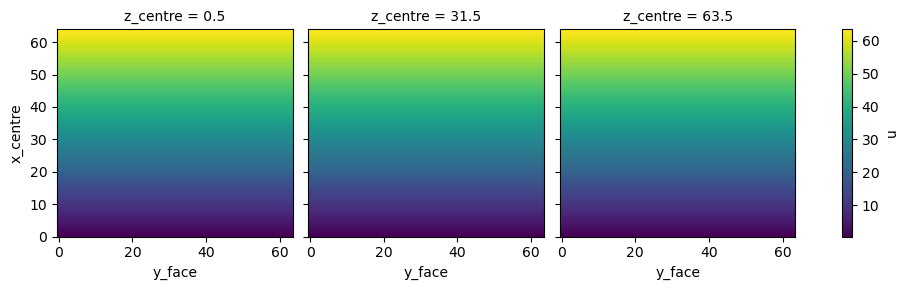

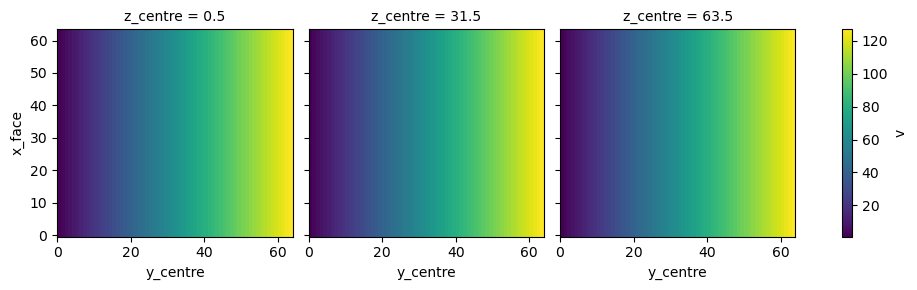

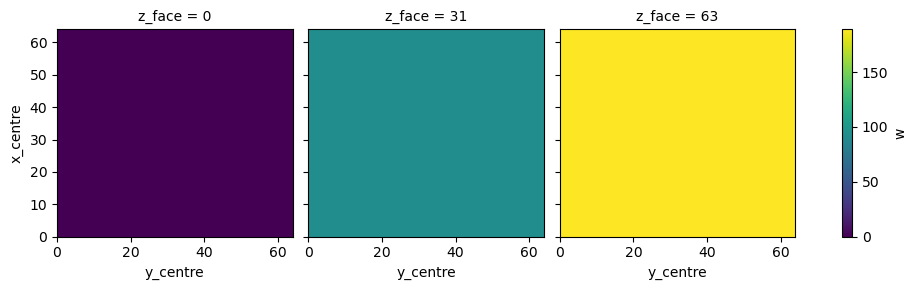

In [12]:
simulation['u'].isel(z_centre = [0, 31, 63 ]).plot(col='z_centre')
plt.show()
simulation['v'].isel(z_centre = [0, 31, 63 ]).plot(col='z_centre')
plt.show()
simulation['w'].isel(z_face = [0, 31, 63 ]).plot(col='z_face')
plt.show()

#### test

In [13]:
grad_u = grad_on_cart_grid(simulation['u'], simulation['u'].dims)
grad_v = grad_on_cart_grid(simulation['v'], simulation['v'].dims)
grad_w = grad_on_cart_grid(simulation['w'], simulation['w'].dims)

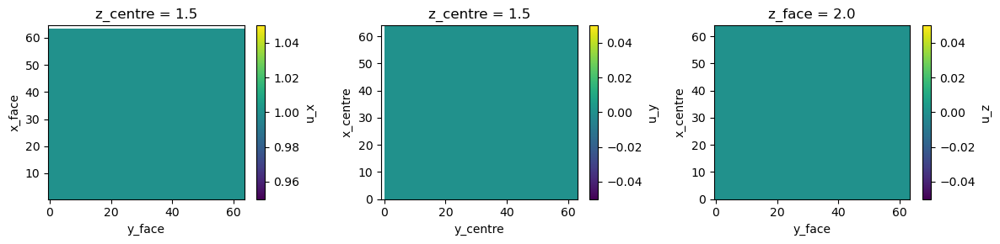

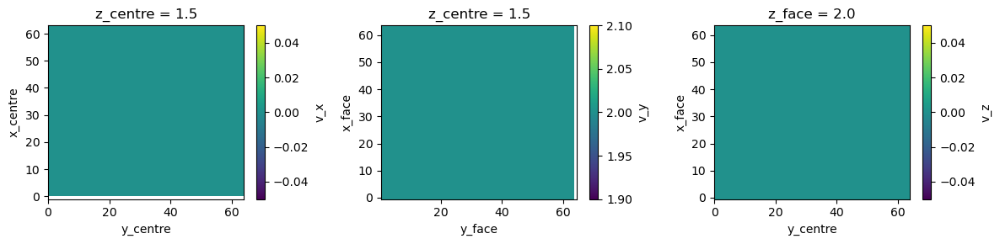

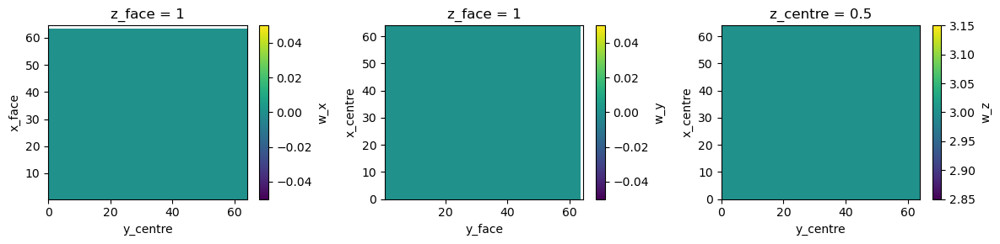

In [17]:
fig, axes = plt.subplots(1, 3, figsize = (12, 3))
grad_u['u_x'].isel(z_centre =1).plot(ax = axes[0])
grad_u['u_y'].isel(z_centre =1).plot(ax = axes[1])
grad_u['u_z'].isel(z_face   =1).plot(ax = axes[2])
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 3, figsize = (12, 3))
grad_v['v_x'].isel(z_centre =1).plot(ax = axes[0])
grad_v['v_y'].isel(z_centre =1).plot(ax = axes[1])
grad_v['v_z'].isel(z_face   =1).plot(ax = axes[2])
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 3, figsize = (12, 3))
grad_w['w_x'].isel(z_face   =1).plot(ax = axes[0])
grad_w['w_y'].isel(z_face   =1).plot(ax = axes[1])
grad_w['w_z'].isel(z_centre =1).plot(ax = axes[2])
plt.tight_layout()
plt.show()

In [20]:
const_nan_right = xr.full_like(grad_u['u_x'], 1.0)
const_nan_right[-1,:,:] = np.nan
const_nan_right

<xarray.DataArray 'u_x' (x_face: 64, y_face: 64, z_centre: 64)>
array([[[ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        ...,
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.]],

       [[ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        ...,
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.]],

       [[ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        ...,
...
        ...,
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.]],

       [[ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        ...,
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * x_face    (x_face) float64 1.0 2.0 3.0 4.0 5.0 ... 60.0 61.0 62.0 63.0 64.0
  * y_face    (y_face) int64 0 1 2 3 4 5 6 7 8 9 ... 55 56 57 58 59 60 61 62 63
  * z_centre  (z_centre) float64 0.5 1.5 2.5 3.5 4.5 ... 60.5 61.5 62.5 63.5

In [18]:
grad_u['u_x']

<xarray.DataArray 'u_x' (x_face: 64, y_face: 64, z_centre: 64)>
array([[[ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        ...,
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.]],

       [[ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        ...,
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.]],

       [[ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        ...,
...
        ...,
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.]],

       [[ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        ...,
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.],
        [ 1.,  1.,  1., ...,  1.,  1.,  1.]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * x_face    (x_face) float64 1.0 2.0 3.0 4.0 5.0 ... 60.0 61.0 62.0 63.0 64.0
  * y_face    (y_face) int64 0 1 2 3 4 5 6 7 8 9 ... 55 56 57 58 59 60 61 62 63
  * z_centre  (z_centre) float64 0.5 1.5 2.5 3.5 4.5 ... 60.5 61.5 62.5 63.5

In [21]:
xr.testing.assert_equal(grad_u['u_x'], const_nan_right)

In [59]:
grad_u_on_cent = interpolate_to_grid(grad_u, ['x_centre', 'y_centre', 'z_centre']).to_dataarray('c1')
grad_u_on_cent['c1'] = ['dx', 'dy', 'dz']
grad_v_on_cent = interpolate_to_grid(grad_v, ['x_centre', 'y_centre', 'z_centre']).to_dataarray('c1')
grad_v_on_cent['c1'] = ['dx', 'dy', 'dz']
grad_w_on_cent = interpolate_to_grid(grad_w, ['x_centre', 'y_centre', 'z_centre']).to_dataarray('c1')
grad_w_on_cent['c1'] = ['dx', 'dy', 'dz']

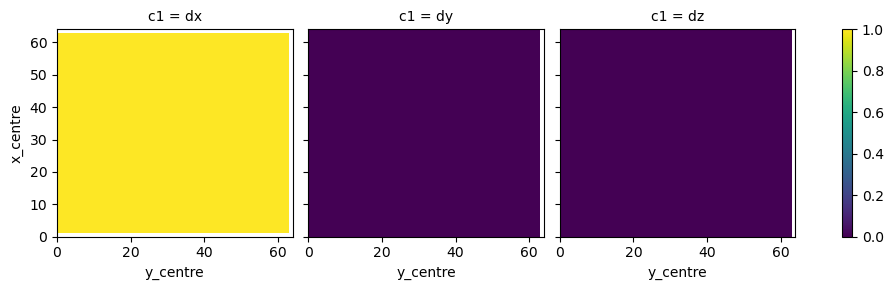

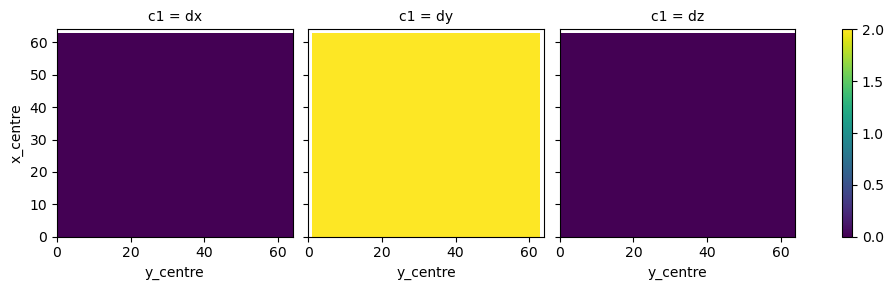

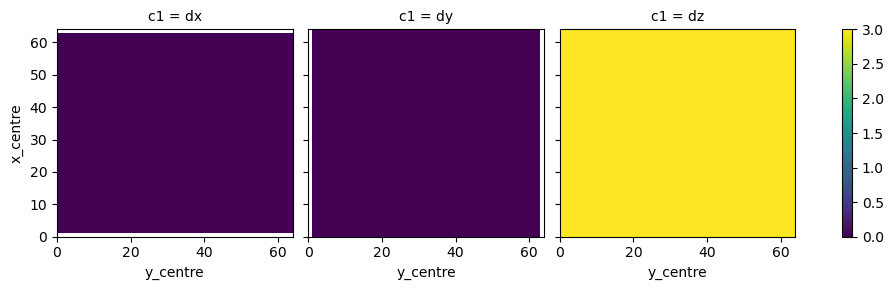

In [60]:
grad_u_on_cent.isel(z_centre =1).plot(col='c1');
plt.show()
grad_v_on_cent.isel(z_centre =1).plot(col='c1');
plt.show()
grad_w_on_cent.isel(z_centre =1).plot(col='c1');
plt.show()

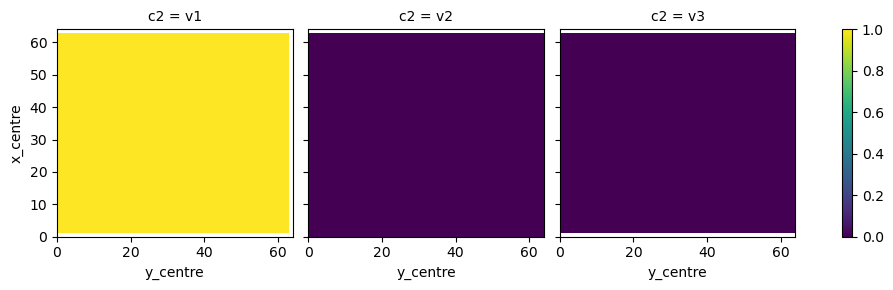

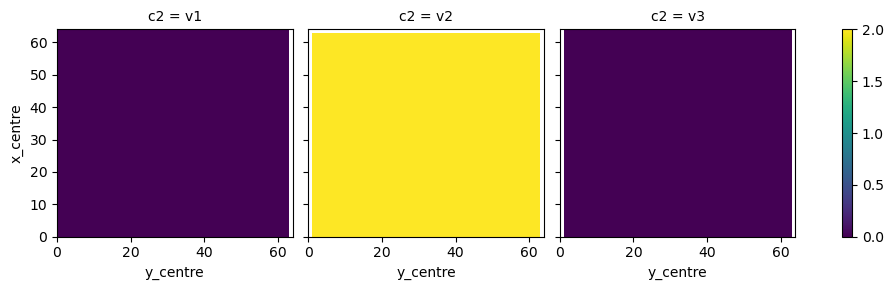

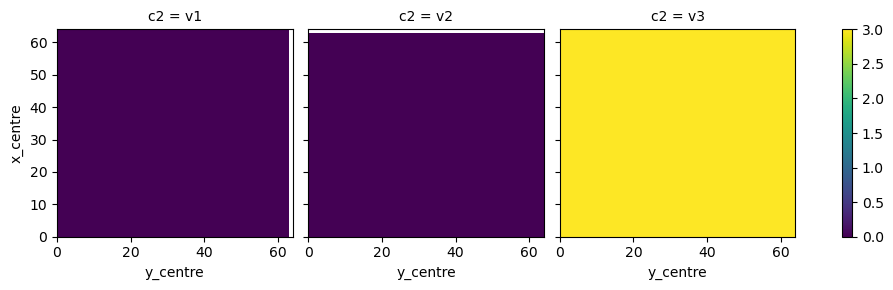

In [69]:
grad_vel = xr.Dataset({'v1': grad_u_on_cent,
                       'v2': grad_v_on_cent,
                       'v3': grad_w_on_cent}).to_dataarray('c2')
grad_vel.isel(z_centre =1, c1 = 0).plot(col='c2');
grad_vel.isel(z_centre =1, c1 = 1).plot(col='c2');
grad_vel.isel(z_centre =1, c1 = 2).plot(col='c2');

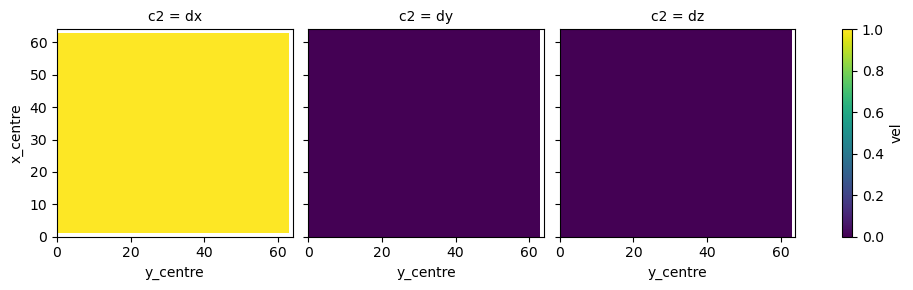

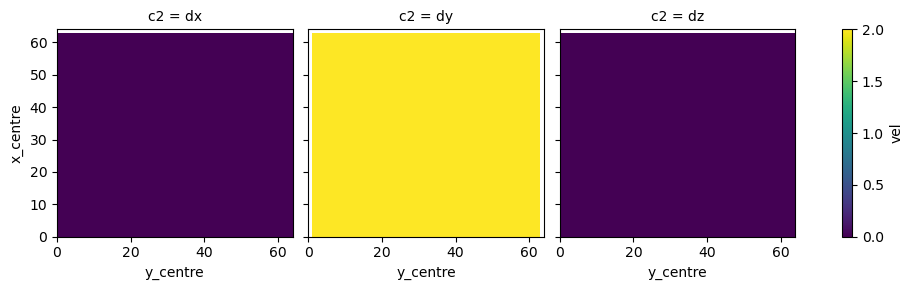

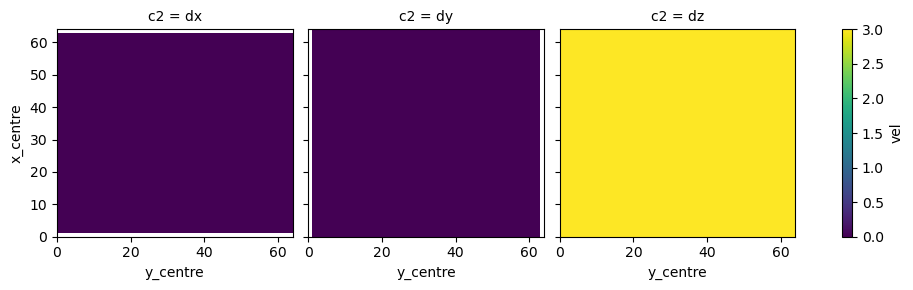

In [70]:
Aij = grad_vec_on_grid(simulation[['u','v','w']], ['x_centre', 'y_centre', 'z_centre'], new_dim_name = ['c1', 'c2'])

Aij.sel(c1 = 'v1').isel(z_centre =1).plot(col='c2');
plt.show()
Aij.sel(c1 = 'v2').isel(z_centre =1).plot(col='c2');
plt.show()
Aij.sel(c1 = 'v3').isel(z_centre =1).plot(col='c2');
plt.show()

#### Strain

In [68]:
import numpy as np

In [74]:
arr = xr.DataArray(np.arange(1, zz10).reshape(3,3), dims = ['c1', 'c2'], coords = {'c1': [1,2,3], 'c2': [1,2,3]})

In [75]:
def symmetrise(gradvec, dims = ('c1', 'c2'), name = None):
    ''' 0.5 (grad_vec + grad_vec.transpose) '''
    transpose_map = dict([dims, dims[::-1]])
    print(transpose_map)
    sij = 0.5 * ( gradvec + gradvec.rename(transpose_map))
    if name is not None:
        sij.name = name
    return sij

In [76]:
transpose_map = {'c1': 'c2', 'c2': 'c1'}

In [78]:
arr

<xarray.DataArray (c1: 3, c2: 3)>
array([[1, 2, 3],
       [4, 5, 6],
       [7, 8, 9]])
Coordinates:
  * c1       (c1) int64 1 2 3
  * c2       (c2) int64 1 2 3

In [77]:
arr + arr.rename(transpose_map).sortby(['c1', 'c2'])

<xarray.DataArray (c1: 3, c2: 3)>
array([[ 2,  6, 10],
       [ 6, 10, 14],
       [10, 14, 18]])
Coordinates:
  * c1       (c1) int64 1 2 3
  * c2       (c2) int64 1 2 3